In [84]:
%matplotlib inline
import jax.numpy as jnp
import matplotlib.pyplot as plt


# important imports 
import sys
sys.path.insert(0, "../")  
from TOOL_BOX_OF_FUNCTIONS.GAUSSIAN_PROCESSES_REGRESSION import GP_REGRESSION as GP 
from TOOL_BOX_OF_FUNCTIONS.METROPOLIS_1_CHAIN import METROPOLIS_1_CHAIN as MH
from TOOL_BOX_OF_FUNCTIONS.BAYESIAN_REGRESSION import BAYES_REG as BR 
from TOOL_BOX_OF_FUNCTIONS.FORMATED_PRINTING import FORMATED_PRINTING as PF
from TOOL_BOX_OF_FUNCTIONS.ENTRPY_CONFIDENCE_UTILITY import ENTROPY_CONFIDENCE_UTILITY as ECU

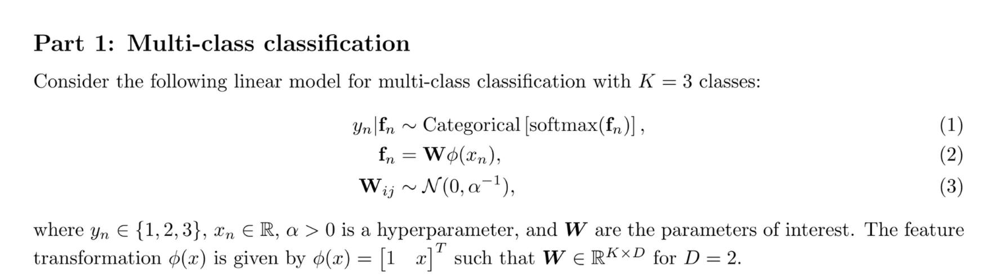

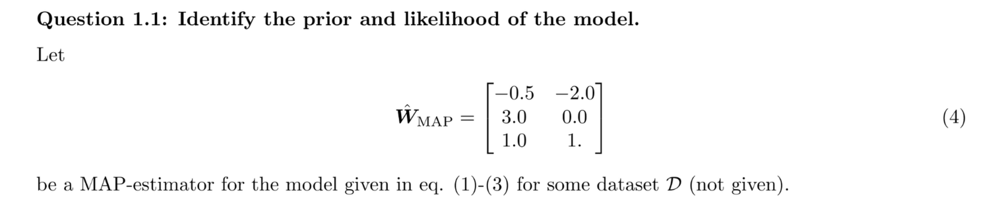

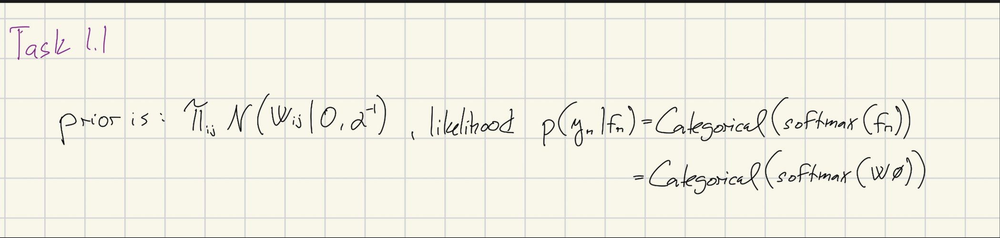

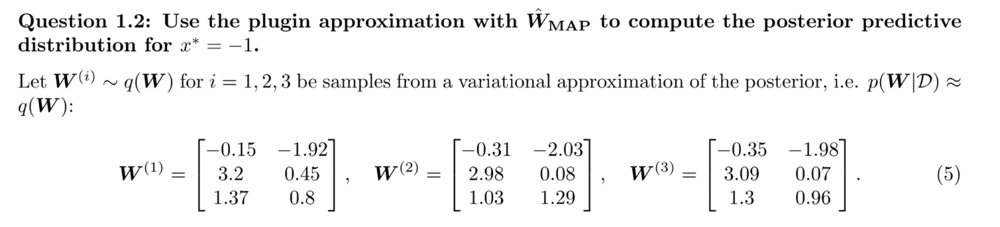

In [85]:
w_map = jnp.array([
    [-0.5, -2.0],
    [3.0, 0.00],
    [1.0, 1.0]
    ])

print(w_map.shape)

(3, 2)


In [86]:
x_star = jnp.array([-1])

PHI = BR.design_matrix(x_star)

print(PHI)
print(PHI.shape)

[[ 1. -1.]]
(1, 2)


In [88]:
pred_x_star = w_map @ PHI.T

In [89]:
softmax = lambda x: jnp.exp(x)/jnp.sum(jnp.exp(x))

In [90]:
soft_res = softmax(pred_x_star)

In [91]:
print(f"p(y*=1|x*=-1)={PF.ffmt(soft_res[0][0])}")
print(f"p(y*=2|x*=-1)={PF.ffmt(soft_res[1][0])}")
print(f"p(y*=3|x*=-1)={PF.ffmt(soft_res[2][0])}")

p(y*=1|x*=-1)=0.18
p(y*=2|x*=-1)=0.79
p(y*=3|x*=-1)=0.04


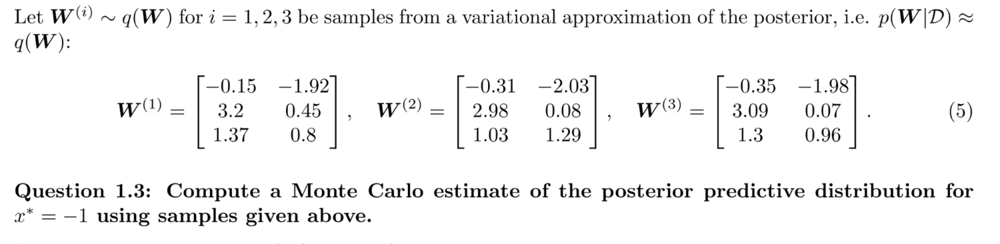

In [104]:
import numpy as np

w_1 = np.array([
    [-0.15, -1.92],
    [3.2, 0.45],
    [1.37, 0.8]
])

w_2 = np.array([
    [-0.31, -2.03],
    [2.98, 0.08],
    [1.03, 1.29]
])

w_3 = np.array([
    [-0.35, -1.98],
    [3.09, 0.07],
    [1.3, 0.96]
])

In [105]:
W_samples = [w_1, w_2, w_3]
p_sampls = [softmax(Wi @ PHI.T) for Wi in W_samples]

print(p_sampls)

[Array([[0.25216544],
       [0.67188379],
       [0.07595077]], dtype=float64), Array([[0.22766372],
       [0.74090293],
       [0.03143336]], dtype=float64), Array([[0.1890316 ],
       [0.75893352],
       [0.05203488]], dtype=float64)]


In [109]:
mean_vec = np.mean(p_sampls, axis=0)   # shape (3,1)


print(f"p(y*=1|x*=-1)={PF.ffmt(mean_vec[0][0])}")
print(f"p(y*=2|x*=-1)={PF.ffmt(mean_vec[1][0])}")
print(f"p(y*=3|x*=-1)={PF.ffmt(mean_vec[2][0])}")

p(y*=1|x*=-1)=0.22
p(y*=2|x*=-1)=0.72
p(y*=3|x*=-1)=0.05


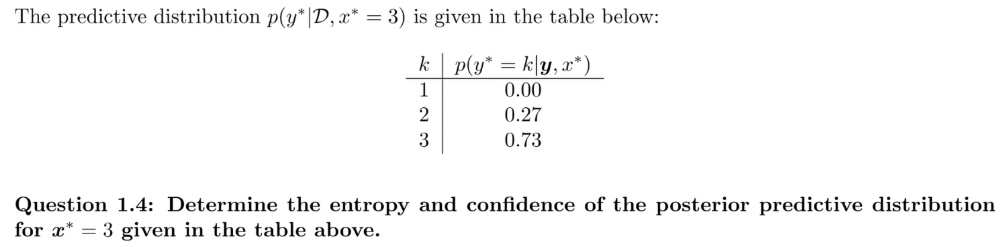

In [10]:
preds = jnp.array([0.00,0.27,0.73])

In [11]:
entropy = ECU.entropy(preds, mine=False)
confidence = ECU.confidence(preds)

In [12]:
print(entropy)
print(confidence)

0.583258840128597
0.73


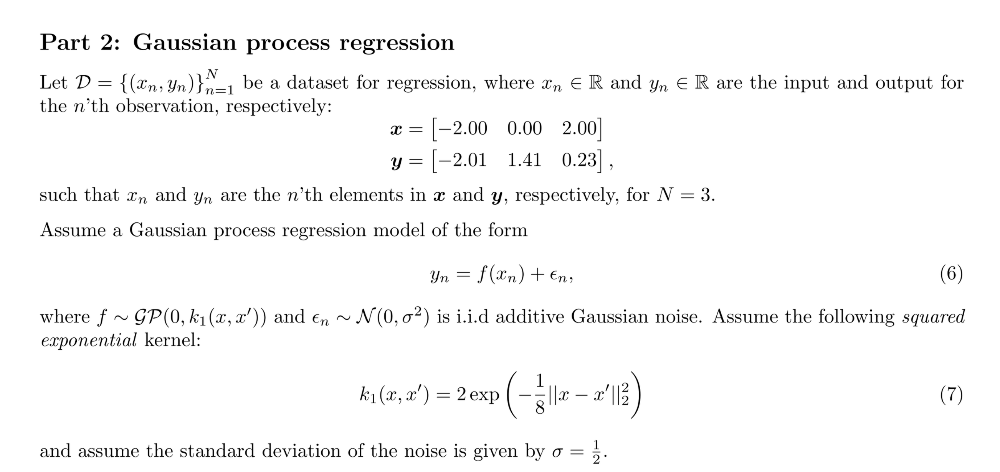

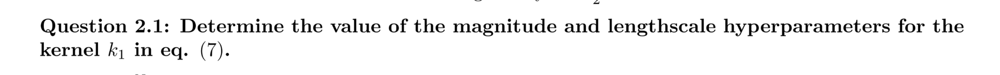

XXX

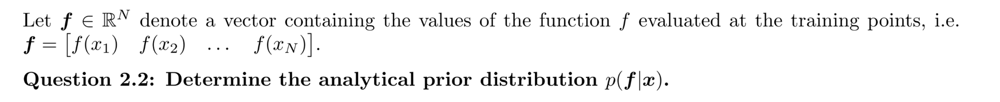

In [13]:
x = jnp.array([-2.00, 0.00, 2.00]).reshape(-1, 1)

y = jnp.array([-2.01, 1.41, 0.24]).reshape(-1, 1)


In [14]:
kernel = GP.StationaryIsotropicKernel(kernel_fun=GP.squared_exponential, kappa=jnp.sqrt(2), lengthscale=2 )

model = GP.GaussianProcessRegression(X=x, y=y, kernel=kernel, kappa=jnp.sqrt(2), lengthscale=2, sigma=0.5)

In [15]:
mu_p, S_p = model.prior_predictive_f_star(x)


PF.print_fmt("Prior Predictive for a Gaussian Processes has a mean\n", mu_p, "\n and\n variance \n", S_p)

Prior Predictive for a Gaussian Processes has a mean
 [[0.00]
 [0.00]
 [0.00]] 
 and
 variance 
 [[2.00 1.21 0.27]
 [1.21 2.00 1.21]
 [0.27 1.21 2.00]]


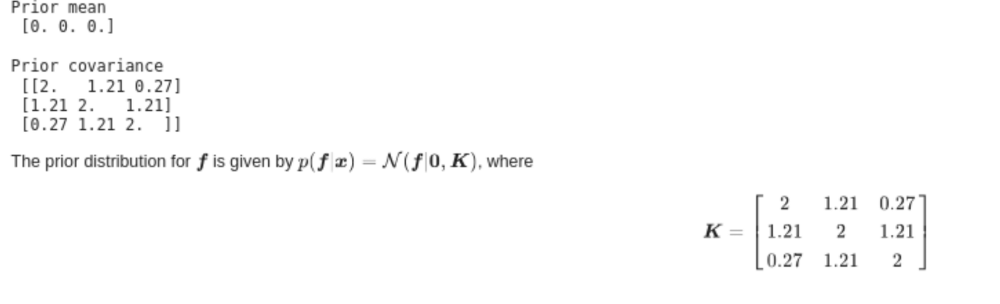

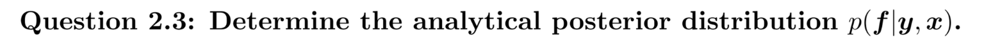

In [16]:
mu_post_f, S_post_f = model.predict_f(x)

In [17]:
print(mu_post_f)

[[-1.5287363 ]
 [ 0.88761409]
 [ 0.43707654]]


In [18]:
print(S_post_f)

[[ 0.20844192  0.02778709 -0.00998173]
 [ 0.02778709  0.19226005  0.02778709]
 [-0.00998173  0.02778709  0.20844192]]


In [19]:
mu_post_f_2, S_post_f_2 = model.posterior()

In [20]:
print(mu_post_f_2)

[[-1.5287363 ]
 [ 0.88761409]
 [ 0.43707654]]


In [21]:
print(S_post_f_2)

[[ 0.20844192  0.02778709 -0.00998173]
 [ 0.02778709  0.19226005  0.02778709]
 [-0.00998173  0.02778709  0.20844192]]


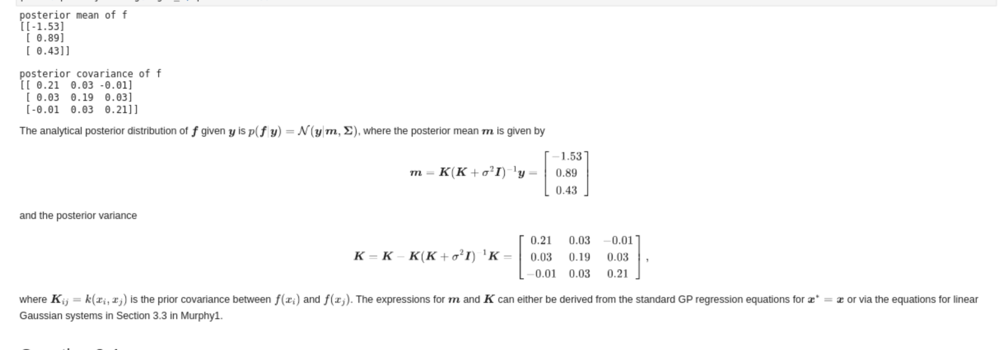

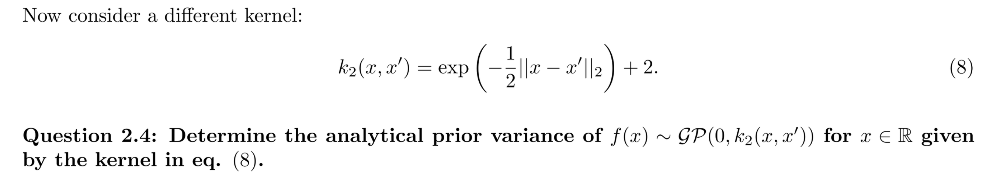

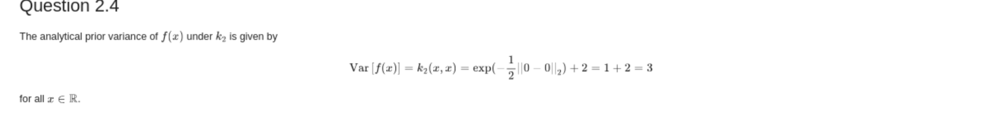

In [22]:
def k2_fun(tau, kappa, ell):
    return jnp.exp(-0.5 * tau) + 2.0

In [23]:
kernel_2 = GP.StationaryIsotropicKernel(kernel_fun=k2_fun, kappa=1, lengthscale=1)

model_2 = GP.GaussianProcessRegression(X=x, y=y, kernel=kernel_2, kappa=1, lengthscale=1, sigma=0.5)

In [24]:
mu_2_prior, S_f_prior = model_2.prior_predictive_f_star(X=jnp.array([0]))

In [25]:
print(mu_2_prior)

[[0.]]


In [26]:
print(S_f_prior)

[[3.00000001]]


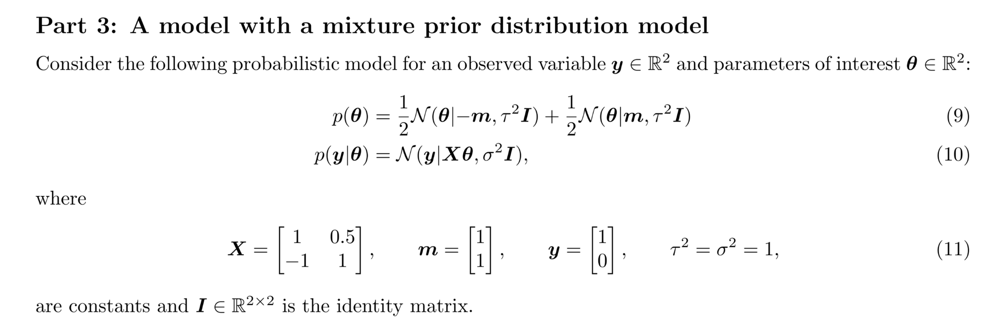

In [27]:
from TOOL_BOX_OF_FUNCTIONS.OLS import OLS as OLS 

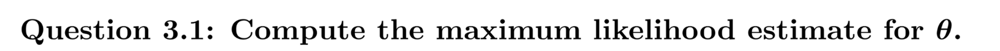

In [28]:
X = jnp.array([
    [1, 0.5],
    [-1, 1]
])

y = jnp.array([
    [1,0]
])

In [29]:
theta_MLE = OLS.get_w_mle(X, y)
print(theta_MLE)

[[0.66666667]
 [0.66666667]]


In [30]:
sigma_LE = OLS.get_sigma2_mle(X, y, theta_MLE)
print(sigma_LE)

0.0


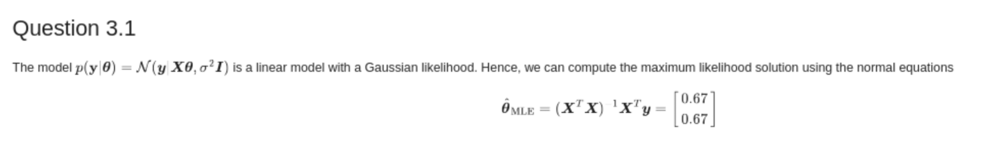

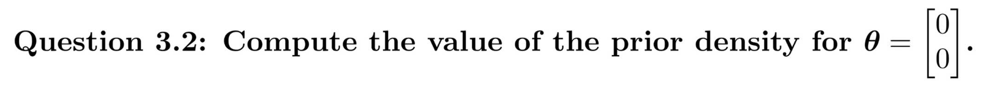

In [31]:
from scipy.stats import norm
from scipy.stats import multivariate_normal

def prior(theta, m, tau):
    d = len(theta)
    cov = (tau**2) * jnp.eye(d)
    m1 = multivariate_normal.pdf(theta, -m, cov)
    m2 = multivariate_normal.pdf(theta, m, cov)
    return 0.5 * m1 + 0.5 * m2 

theta = jnp.array([0.0, 0.0])
density = prior(theta, m=jnp.array([1.0, 1.0]), tau=1.0)

print(density)

0.05854983152431917


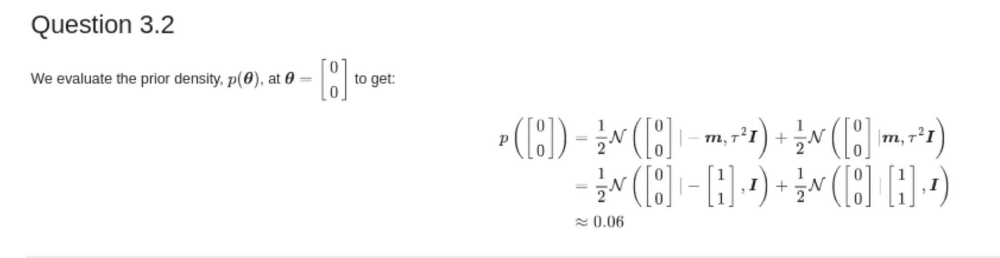

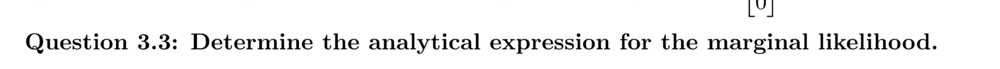

In [32]:
def p_y(y, x, m, tau, sigma):
    d = len(theta)
    sig_z =  tau**2
    sig_y = jnp.eye(d) * sigma**2
    C = sig_y + x @ x.T * sig_z
    m1 = multivariate_normal.pdf(x=y, mean=-x @ m, cov=C)
    m2 = multivariate_normal.pdf(x=y, mean=x @  m, cov=C)
    return 0.5 * m1 + 0.5 * m2 
    
evidence = p_y(y=y, x=X, m=jnp.array([1.0, 1.0]), tau=1, sigma=1)

def likelihood(y, x, theta, sigma):
    mean = x @ theta
    print(mean)
    d = len(theta)
    cov = jnp.eye(d) * sigma**2
    return multivariate_normal.pdf(x=y, mean=mean, cov=cov)
theta_0 = jnp.array([0, 0])


sigma2 = 1.0

mu = X @ theta_0                         # [0., 0.]
cov = sigma2 * jnp.eye(2)

likelihood = likelihood(y, X, theta_0, 1)
likelihood

[0. 0.]


np.float64(0.09653235263005393)

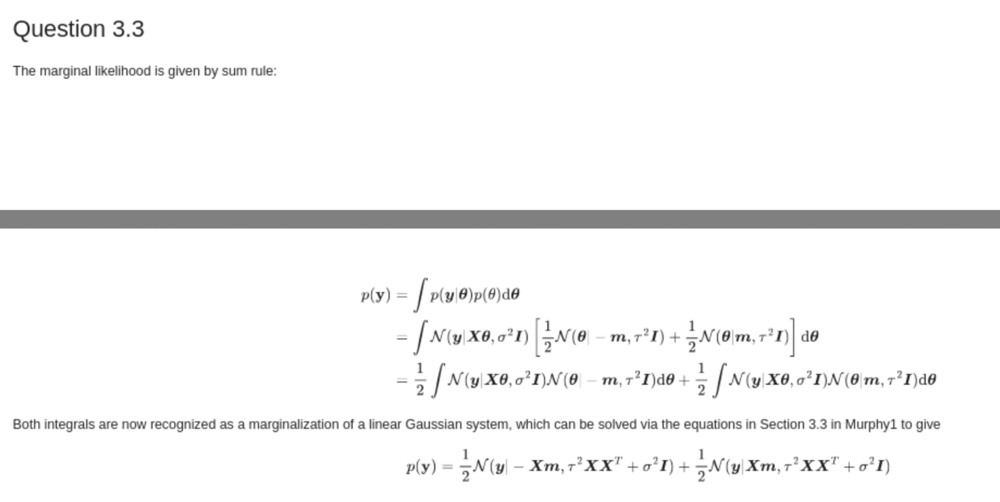

In [33]:
print((likelihood * density) / evidence)

0.15341385696171722


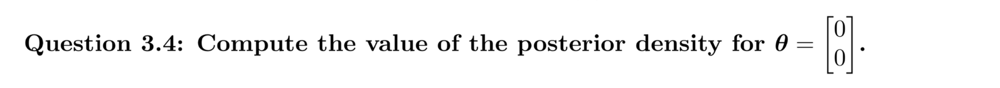

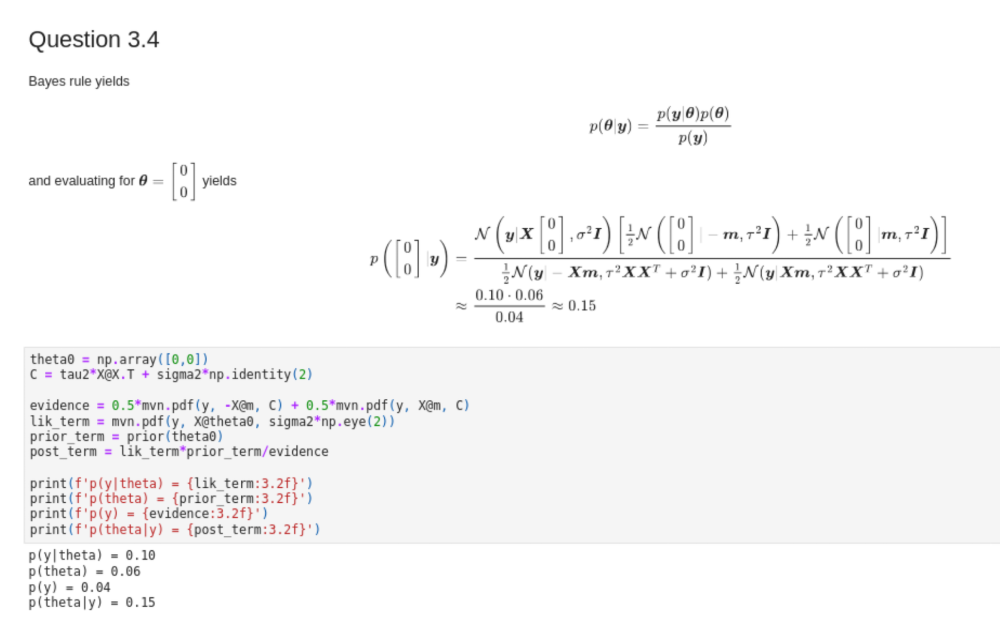

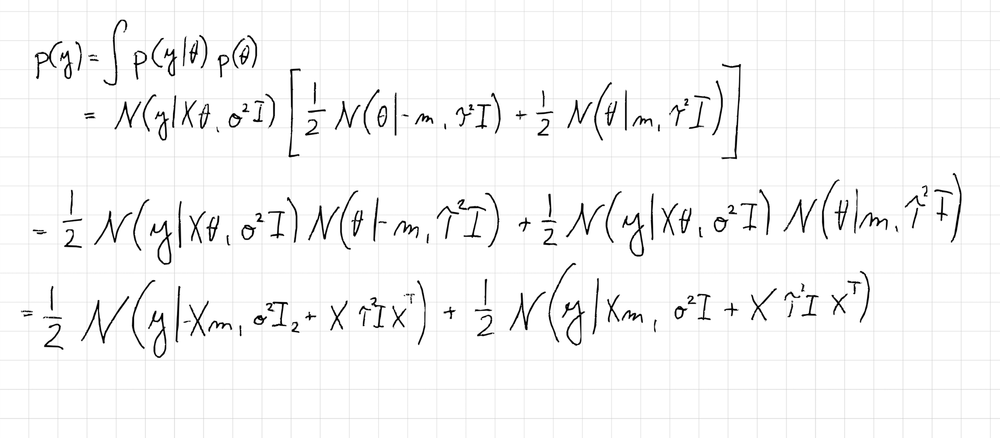

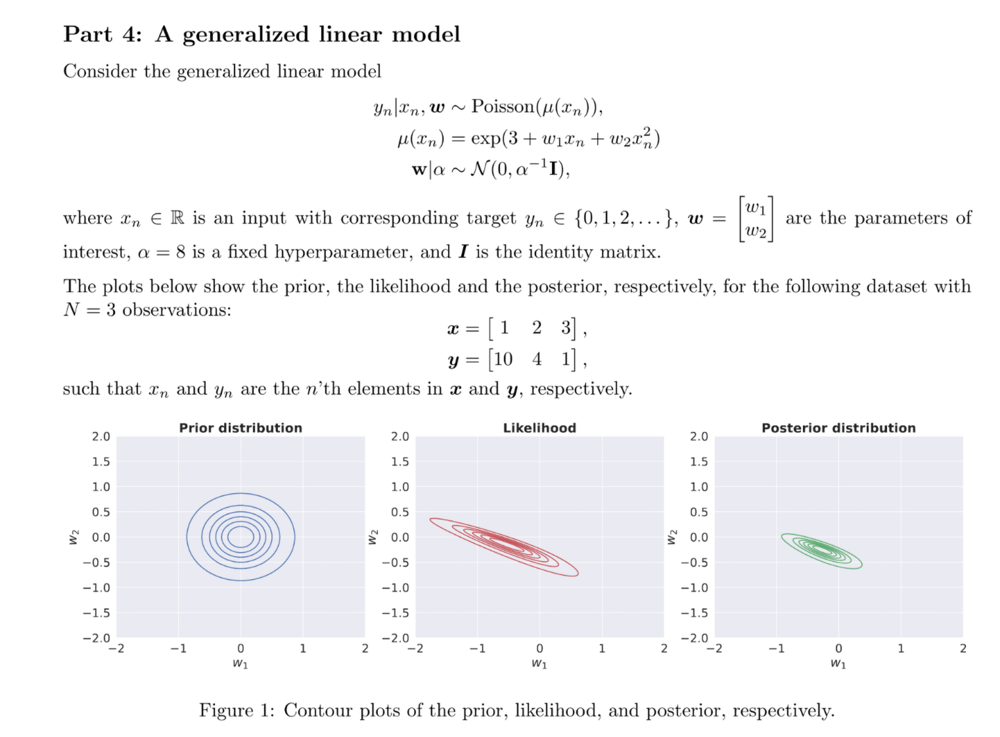

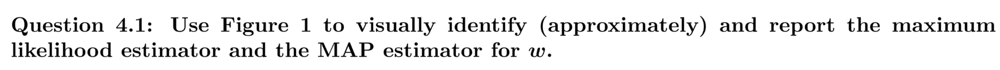

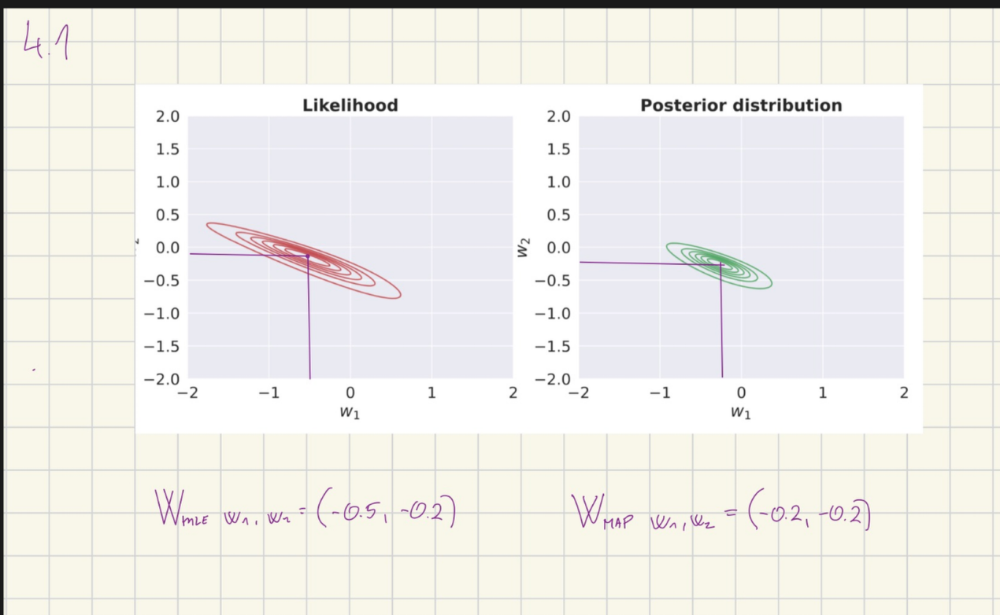

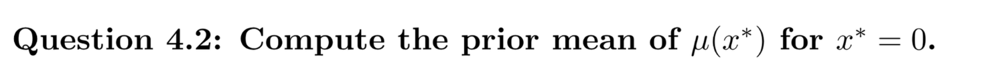

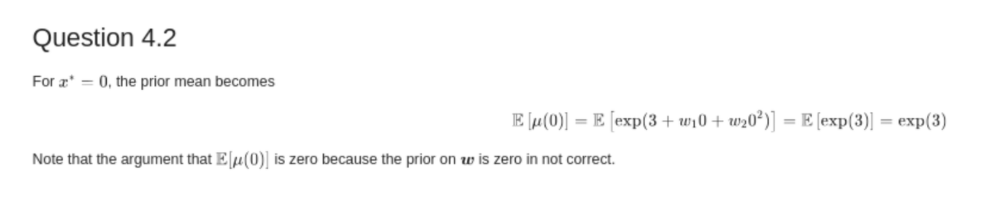

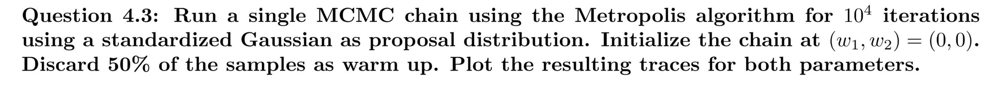

In [34]:
from scipy.stats import poisson
alpha = 8
x = jnp.array([1., 2., 3.])
y = jnp.array([10, 4, 1])

# design matrix 
X = jnp.column_stack((x, x**2))

def log_likelihood(w):
    mu = jnp.exp(3 + X @ w)
    log_prior = multivariate_normal.logpdf(w, jnp.zeros(2), 1/alpha *jnp.eye(2))
    log_lik = poisson.logpmf(y, mu).sum()
    return log_prior + log_lik

In [35]:
theta = MH.metropolis(log_target=log_likelihood, num_params=2, tau=1, num_iter=50000, theta_init=jnp.array([0, 0]))

Acceptance ratio: 0.04
50001
(50001, 2)


In [36]:
print(theta.shape)

(50001, 2)


In [37]:
theta_after = theta[5000:, :]

In [38]:
print(theta_after.shape)

w1 = theta_after[:, 0]
w2 = theta_after[:, 1]

(45001, 2)


In [39]:
print(w1.shape)

(45001,)


Text(0.5, 0.01, 'Iterations')

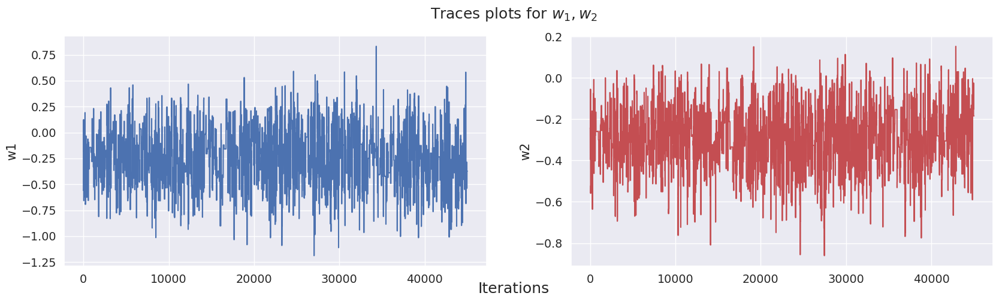

In [40]:
fig, axes = plt.subplots(1, 2, figsize=(20, 5))

# Trace plot
axes[0].plot(theta_after[:, 0], label='Before warm-up')
axes[0].set_ylabel('w1')
axes[1].plot(theta_after[:, 1], label='Before warm-up', c='r')
axes[1].set_ylabel('w2')
fig.suptitle('Traces plots for $w_1, w_2$')
# Common x-axis label
fig.supxlabel('Iterations')  # Set your desired label here

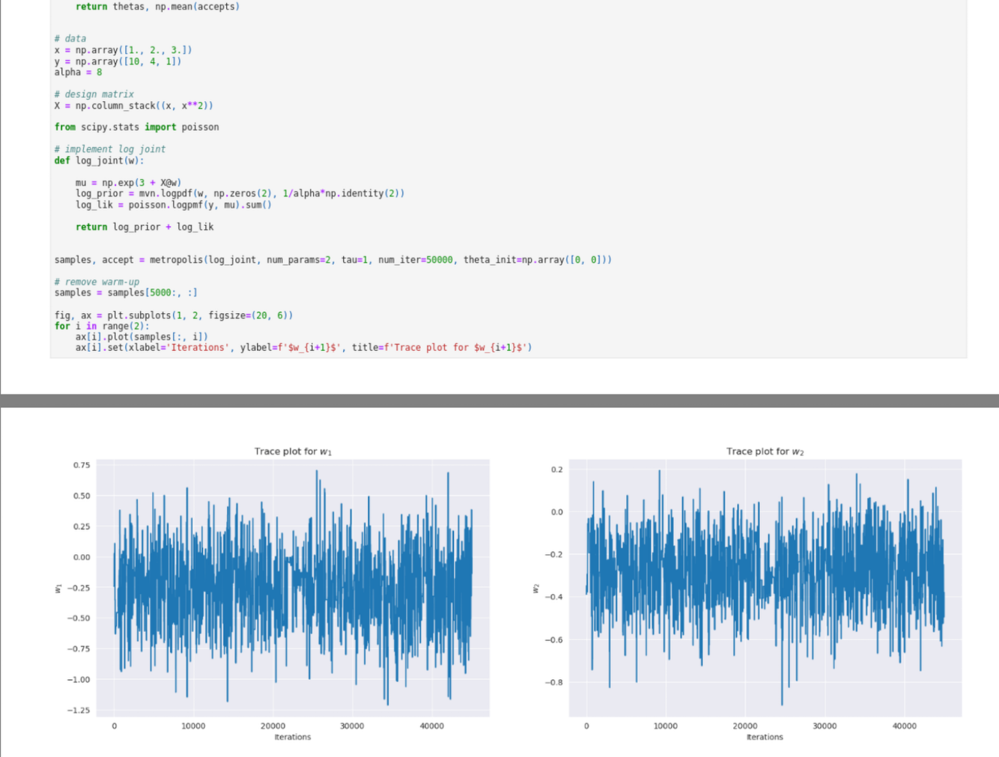

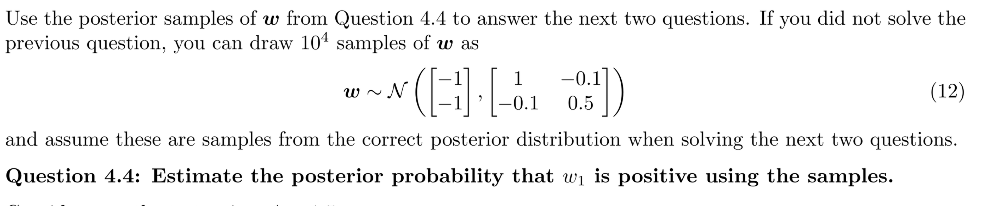

In [41]:
from jax import random
key = random.PRNGKey(0)

N = 50000

mu = jnp.array([-1, -1])
COV = jnp.array([[1, -0.1], [-0.1, 0.5]])

w_samples = random.multivariate_normal(key=key, mean=mu, cov=COV,shape=(N, ))

print(w_samples.shape)

w_1_mn = w_samples[:, 0]

(50000, 2)


In [42]:
print(theta_after.shape)


weight_1 = theta_after[:, 0]

print(weight_1)

(45001, 2)
[-0.55835169 -0.55835169 -0.55835169 ... -0.37198107 -0.37198107
 -0.37198107]


In [43]:
print(f"Probability of w_1 is positive, from the MH sampler is {jnp.mean(weight_1 > 0)}")
print(f"Probability of w_1 is positive, from the MH sampler is {jnp.mean(theta_after[:, 0] > 0)}")

Probability of w_1 is positive, from the MH sampler is 0.18492922186851501
Probability of w_1 is positive, from the MH sampler is 0.18492922186851501


In [44]:
print(f"Probability of w_1 is positive, from the MN sampler is {jnp.mean(w_1_mn > 0)}")

Probability of w_1 is positive, from the MN sampler is 0.1550000011920929


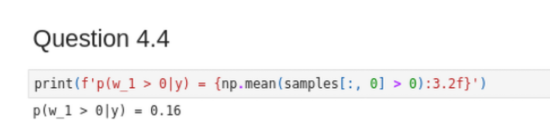

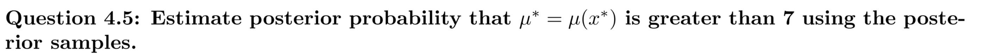

In [45]:
x_star = jnp.column_stack((1.5, 1.5**2))

In [46]:
f_1_5 = x_star @ theta_after.T 

mu_75 = jnp.exp(3 + f_1_5)

In [47]:
print(jnp.mean(mu_75 > 7))

0.5850981


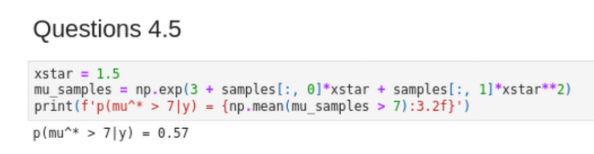

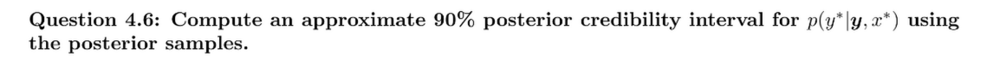

In [49]:
key_poisson = random.PRNGKey(1)
y_75 = random.poisson(key_poisson, mu_75)

In [50]:
jnp.percentile(y_75, jnp.array([5, 95]))

Array([ 3., 13.], dtype=float64)

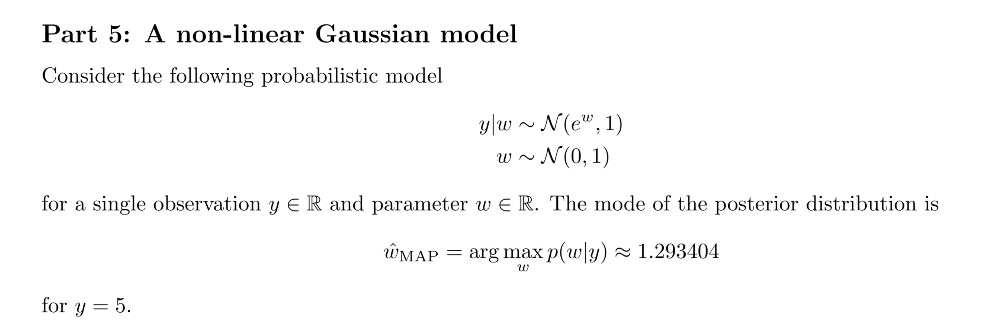

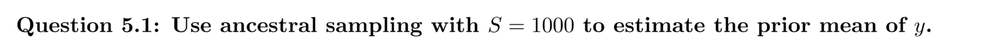

In [4]:
from jax import random
key = random.PRNGKey(0)
print(f"The random generated key: {key}")


# Number of samples 
S = 1000
print(f"Number of samples {S}")
print("")

N = 2 # specify how many keys you want 
k1, k2 = random.split(key, N)

The random generated key: [0 0]
Number of samples 1000



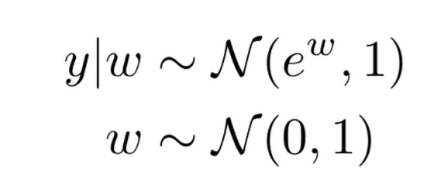

In [5]:
import importlib
import TOOL_BOX_OF_FUNCTIONS.SAMPLING as sampling_module

importlib.reload(sampling_module)
from TOOL_BOX_OF_FUNCTIONS.SAMPLING import SAMPLING as SAMP

In [6]:
mu_1 = 0 
var_1 = 1 

w = mu_1 + var_1 * random.normal(k1, shape=(S,))
print(jnp.mean(w))

0.03533455202718412


In [7]:
w_1_method = SAMP.sample_normal_from_variance(mu=mu_1, var=var_1, shape=(S,), seed=21)
print(jnp.mean(w_1_method))

0.003185398361981319


In [8]:
mu_2 = jnp.exp(w)
var_2 = 1 
y_given_w =  mu_2 + var_2 *  random.normal(k2, shape=(S, ))
print(f"Prior mean of y is {jnp.mean(y_given_w):.2f}")

Prior mean of y is 1.66


In [9]:
y_give_w_method = SAMP.sample_normal_from_variance(mu=mu_2, var=var_2, shape=(S, ), seed=1)
print(f"Prior mean of y is {jnp.mean(y_give_w_method):.2f}")

Prior mean of y is 1.65


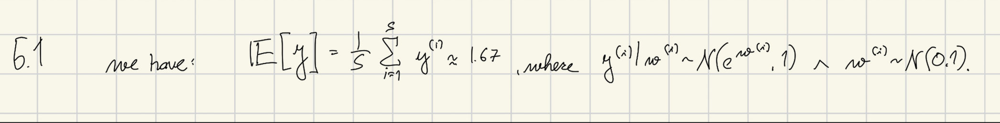

________________________

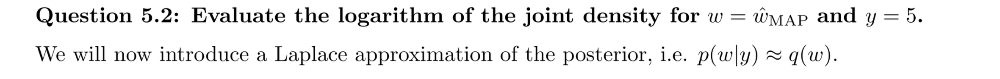

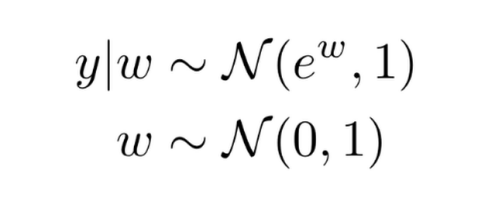

In [12]:
log_npdf = lambda x, m, v: -(x-m)**2/(2*v) - 0.5*jnp.log(2*jnp.pi*v)

y = 5
w_map_5 = 1.293404

# model
log_prior = lambda w: log_npdf(w, 0, 1)
log_lik = lambda w: log_npdf(5, jnp.exp(w), 1)
log_joint = lambda w: log_prior(w) + log_lik(w)

print(f"Log joint at w_map {log_joint(w_map_5):.2f}")

Log joint at w_map -3.59


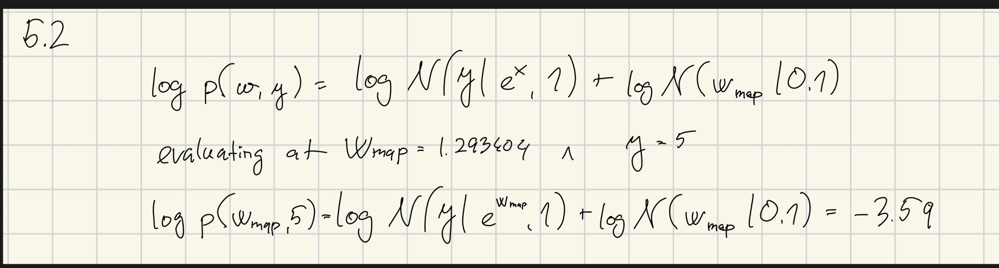

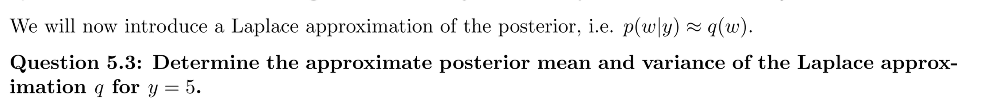

In [13]:
from jax import grad, hessian

In [14]:
H = hessian(log_joint)(w_map_5)
print(H)

-9.348713455157387


In [15]:
S = - 1/H 

In [16]:
print(S)

0.10696659008714529


The laplace approximate mean and variance of laplace approqimation $q(w) = \mathcal{N}(w| -3.59, 0.10)$. 

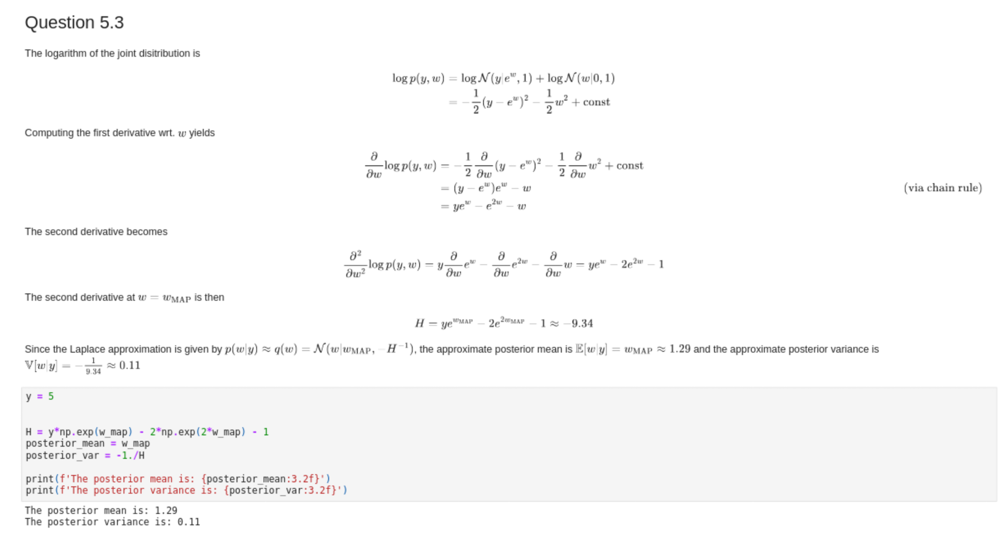

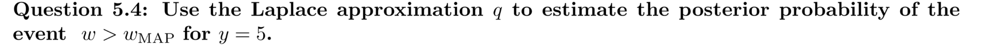

# What is the question asking?

You observed $y=5$ in the model
$$
y \mid w \sim \mathcal N\!\big(e^{w},\,1\big), \qquad w \sim \mathcal N(0,1).
$$

Here, $w$ is the unknown parameter (a random variable in Bayesian inference).  
After seeing $y$, we care about the posterior $p(w \mid y)$.

The event in 5.4, $\{\,w > w_{\text{MAP}}\,\}$, is a **posterior tail probability**:  
“given the data, what is the probability that the true $w$ is larger than the posterior mode?”  
So it’s not about the prior; it’s a probability statement about $w$ **under the posterior**.

---

## Laplace: what distribution are we using?

Laplace approximates the posterior by a Gaussian
$$
q(w \mid y) \approx \mathcal N\!\big(\mu,\,\sigma^2\big),
\quad
\mu = w_{\text{MAP}}, 
\quad
\sigma^2 = \Big[\;2 e^{2w} - y e^{w} + 1\;\Big]^{-1}\Big|_{w = w_{\text{MAP}}}.
$$

5.4 asks for $$\Pr_q(w > w_{\text{MAP}}) = \Pr_q(w > \mu)$$.  
Because a Normal is symmetric about its mean,
$$
\Pr_q(w > \mu) = \tfrac{1}{2}.
$$
That’s the analytic one-liner.

---

## Why Monte-Carlo works (and what you computed)

Any probability under a distribution is an expectation of an indicator:
$$
\Pr_q(w > c) \;=\; \mathbb E_q\!\big[\mathbf 1\{w>c\}\big].
$$

Monte-Carlo approximates that expectation by sampling from the **same** distribution:

1) Draw $w^{(s)} \sim q(w \mid y) = \mathcal N\!\big(w_{\text{MAP}},\,\sigma^2\big)$, for $s=1,\dots,S$.  
2) Estimate
$$
\hat p \;=\; \frac{1}{S}\sum_{s=1}^S \mathbf 1\{\,w^{(s)} > c\,\}.
$$

Setting $c = w_{\text{MAP}}$ gives a fraction very close to $0.5$ (by symmetry + law of large numbers).  
So code like `mean(w_s > w_map)` with $w_s \sim \mathcal N(w_{\text{MAP}}, \sigma^2)$ is exactly this estimator.

---

## General template (useful beyond this problem)

For any threshold $c$ (not necessarily the MAP),
$$
\Pr_q(w > c) \;=\; 1 - \Phi\!\left(\frac{c - w_{\text{MAP}}}{\sigma}\right),
$$
or estimate it by Monte-Carlo with the same indicator trick.

If you used the **true** posterior (not Laplace), the probability need not be $0.5$ — in this model it’s actually larger due to right-skew.  
The “$0.5$” comes only from the **Gaussian, centered** Laplace approximation.


_______

# Posterior tail probability via Laplace & Monte-Carlo

You observed $y=5$ in the model
$$
y \mid w \sim \mathcal N\!\big(e^{w},\,1\big), 
\qquad 
w \sim \mathcal N(0,1).
$$

## What we’re computing (conceptually)
You want a posterior tail probability:
$$
\Pr(w>c \mid y).
$$
That’s “how much posterior mass lies to the **right** of the vertical line at $c$.”
In 5.4 they choose $c = w_{\text{MAP}}$, so we ask
$$
\Pr\big(w > w_{\text{MAP}} \mid y\big).
$$

## Why compare to $w_{\text{MAP}}$ under Laplace?
Laplace approximates the posterior by a Gaussian centered at the MAP:
$$
q(w \mid y) \approx \mathcal N(\mu, \sigma^2),
\qquad
\mu = w_{\text{MAP}}.
$$
For a Normal, **mean = mode = median**. The line at $w_{\text{MAP}}$ is the midpoint of the bell.
By symmetry,
$$
\Pr_{q}\!\big(w > w_{\text{MAP}}\big) = \tfrac{1}{2}.
$$
That’s the one-line analytic answer.

## Why sampling works (in one sentence)
Any probability is an expectation of an indicator:
$$
\Pr_{q}(w > c) = \mathbb E_{q}\!\big[\mathbf 1\{w > c\}\big].
\Pr_{q}(w>c) \;=\; \mathbb E_{q}\!\big[\mathbf 1\{w>c\}\big].
$$
Draw $w^{(s)} \sim q$ and average $\mathbf 1\{w^{(s)} > c\}$ to estimate that area (Law of Large Numbers).

**MC recipe for this problem**
1. Sample $w^{(s)} \sim \mathcal N\!\big(w_{\text{MAP}},\,\sigma^2\big),\ s=1,\dots,S.$
2. Compute $\hat p \;=\; \frac{1}{S}\sum_{s=1}^S \mathbf 1\{w^{(s)} > w_{\text{MAP}}\} \approx 0.5.$

## Intuition you can reuse next time
1. Pick a threshold $c$ for the event you care about (e.g., “is the weight positive?” $c=0$).
2. Turn it into **area under the (approximate) posterior**:
   $$
   \Pr(w>c \mid y) = \text{area to the right of } c.
   $$
3. Compute it:
   - **Analytically (Normal)**: $\Pr_{q}(w>c) = 1 - \Phi\!\left(\frac{c-\mu}{\sigma}\right). $
   - **Monte-Carlo**: sample from the posterior and average indicators.

## Useful extra insight
If you used the **true** (possibly skewed) posterior instead of the Gaussian Laplace approximation, $\Pr(w>w_{\text{MAP}}\mid y)$ need not be $0.5$.  
In this model it’s actually **>\,0.5** due to right-skew. The exercise uses $w_{\text{MAP}}$ **under Laplace** so symmetry forces the answer to $0.5$ and highlights how tail probabilities reduce to CDF calls or simple MC estimators.

---

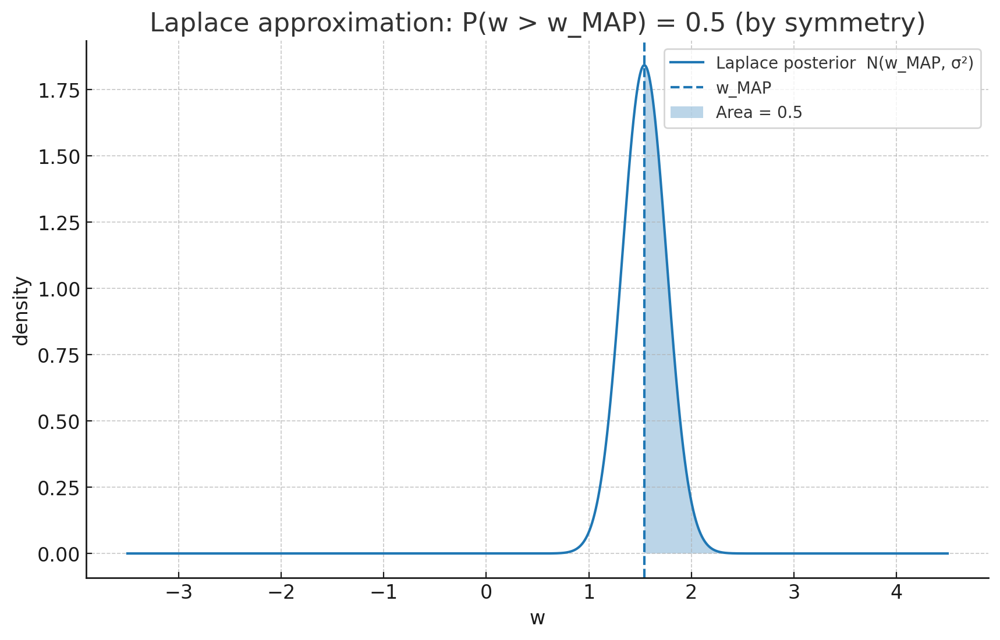

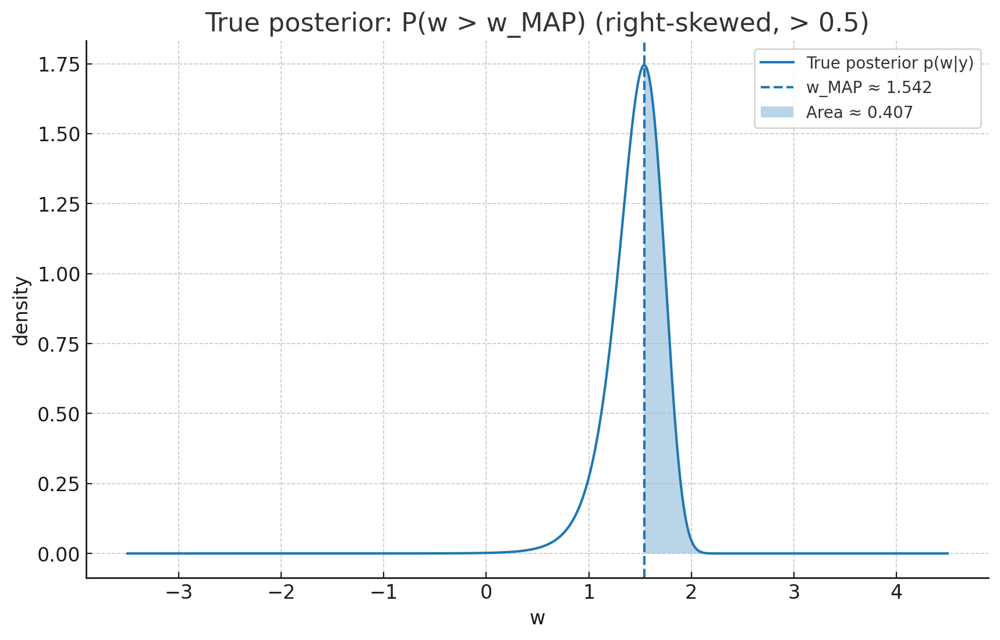

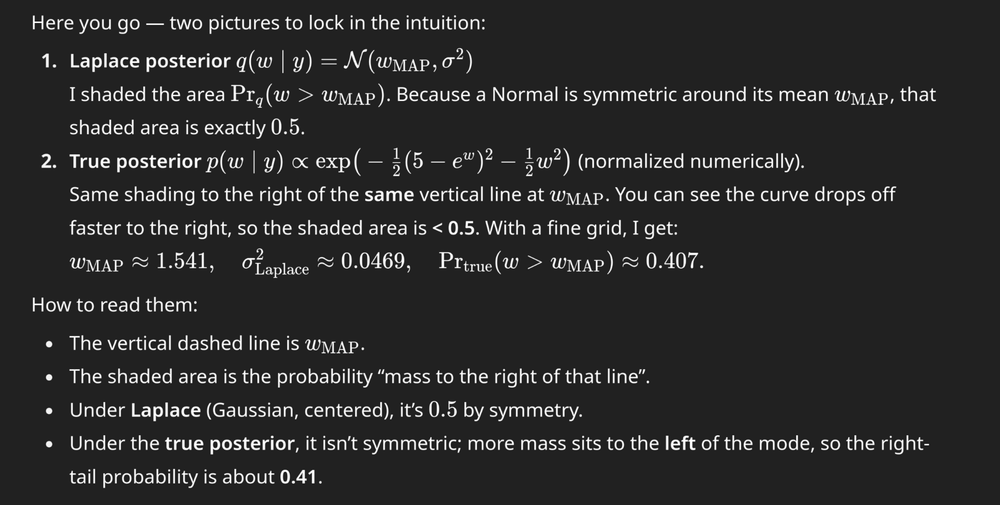

In [22]:
w_s = SAMP.sample_normal_from_variance(mu=w_map_5, var=S, shape=(15000, ), seed=0)

print(jnp.mean(w_s > w_map_5))

0.49346668
